In [9]:
from plotly import tools
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import cufflinks
import pandas
import numpy
import datetime
from tabulate import tabulate

init_notebook_mode(connected=False)
cufflinks.go_offline()

In [10]:
# Load results
results = pandas.read_csv('results/result.csv')
epoch = datetime.datetime.utcfromtimestamp(0)
begin_since_epoch = (begin_dt - epoch).total_seconds()
results['datetime'] = results['time'].apply(
    lambda x: datetime.datetime.utcfromtimestamp(begin_since_epoch + x))
results.set_index('datetime', inplace=True, drop=False)
print('COLUMNS=')
print(results.columns)
print('START=')
print(results.head(1).index[0])
print('END=')
print(results.tail(1).index[0])

COLUMNS=
Index(['time', 'PV7.A', 'PV7.P', 'PV7.Q', 'PV7.QMaxCap', 'PV7.QMaxInd',
       'PV7.SMax', 'PV7.S_curtail_P.y', 'PV7.Ts', 'PV7.WtokW.k',
       ...
       'pandapower.nStrPar', 'pandapower.passMemoryObject', 'pandapower.uR[1]',
       'pandapower.uR[2]', 'pandapower.uR[3]', 'pandapower.uR[4]',
       'pandapower.uR[5]', 'pandapower.uR[6]', 'time.1', 'datetime'],
      dtype='object', length=710)
START=
2016-06-17 00:00:00
END=
2016-06-18 00:00:00


In [11]:
begin = '2016-01-01 00:00:00'
begin_dt = datetime.datetime.strptime(begin, '%Y-%m-%d %H:%M:%S')
debug = pandas.read_csv('debug.csv', parse_dates=[1])
epoch = datetime.datetime.utcfromtimestamp(0)
begin_since_epoch = (begin_dt - epoch).total_seconds()
debug['datetime'] = debug['sim_time'].apply(
    lambda x: datetime.datetime.utcfromtimestamp(begin_since_epoch + x))
debug.set_index('datetime', inplace=True, drop=False)
print('COLUMNS=')
print(debug.columns)
print('START=')
print(debug.head(1).index[0])
print('END=')
print(debug.tail(1).index[0])

COLUMNS=
Index(['sim_time', 'clock', 'KW_7', 'KW_9', 'KW_24', 'KVAR_7', 'KVAR_9',
       'KVAR_24', 'Vpu_7', 'Vpu_9', 'Vpu_24', 'datetime'],
      dtype='object')
START=
2016-06-17 00:00:00
END=
2016-06-18 00:00:00


In [26]:
len(debug)

6328

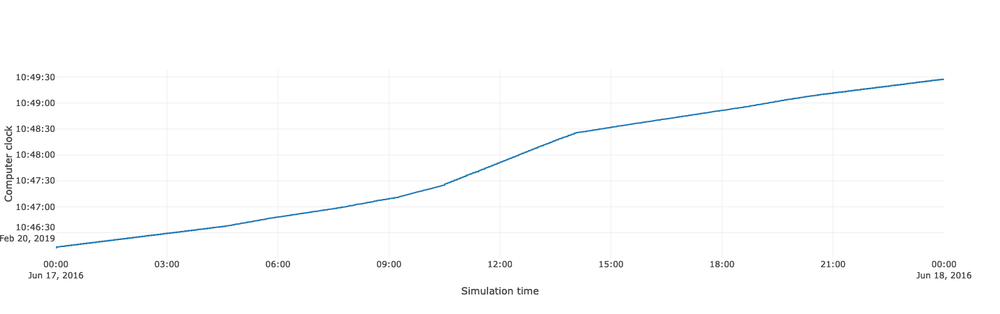

In [12]:
fig = {
    'data': [ 
        
        {'y': debug['clock'].tolist(),
         'x': debug['datetime'].tolist(),
         'text': '', 'mode': 'lines',
         'name': ''},
    ]
,
    'layout': {
        'yaxis': {'title': 'Computer clock'},
        'xaxis': {'title': 'Simulation time'},
        'showlegend': False
    }
}
iplot(fig)

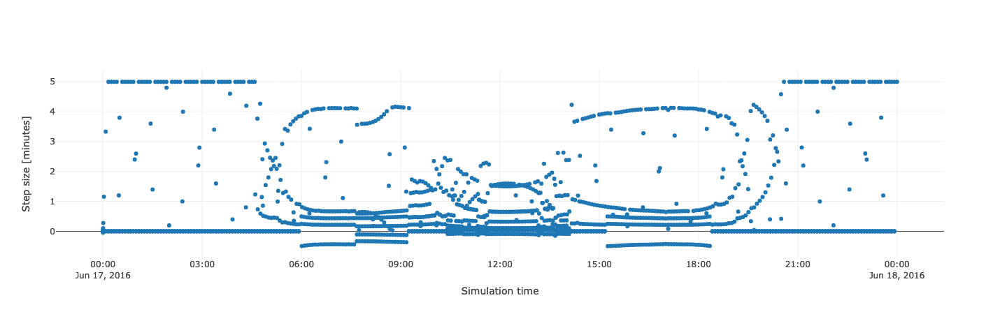

In [13]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': (debug.groupby('sim_time')['sim_time'].tail(1).diff() / 60).tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},
    ]
,
    'layout': {
        'xaxis': {'title': 'Simulation time'},
        'yaxis': {'title': 'Step size [minutes]'},
        'showlegend': False
    }
}
iplot(fig)

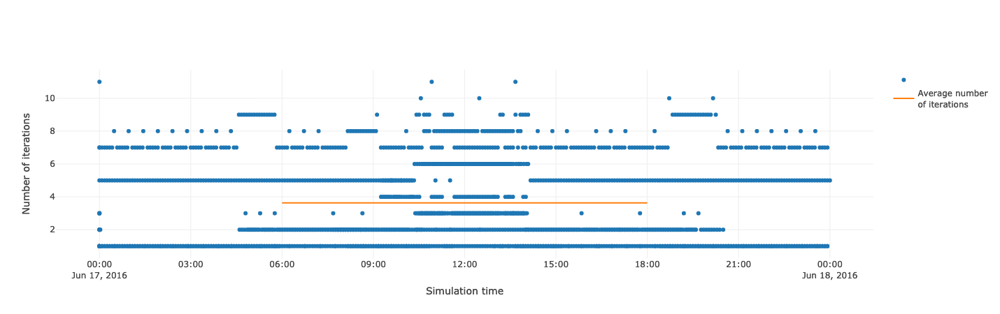

In [14]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': debug.groupby('sim_time')['sim_time'].count().tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},

        {'x': (debug['2016-06-17 06:00:00':'2016-06-17 18:00:00']
               .groupby('sim_time')['datetime'].head(1).tolist()),
         'y': ([debug['2016-06-17 06:00:00':'2016-06-17 18:00:00'].
                groupby('sim_time')['sim_time'].count().mean()] *
               len(debug['2016-06-17 06:00:00':'2016-06-17 18:00:00']
                   .groupby('sim_time')['datetime'].head(1).tolist())),
         'text': '', 'mode': 'lines',
         'name': 'Average number<br>of iterations'},
    ]
,
    'layout': {
        'xaxis': {'title': 'Simulation time'},
        'yaxis': {'title': 'Number of iterations'},
        'showlegend': True
    }
}
iplot(fig)

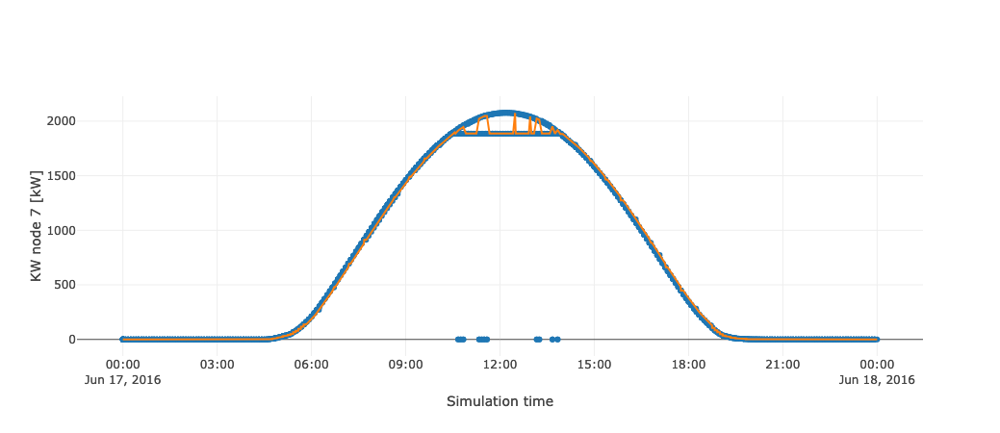

In [24]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].tail(1).tolist(),
         'y': debug.groupby('sim_time')['KW_7'].tail(1).tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},

        {'x': results['datetime'].tolist(),
         'y': results['pandapower.KW_7'].tolist(),
         'text': '', 'mode': 'lines',
         'name': ''},
    ]
,
    'layout': {
        'yaxis': {'title': 'KW node 7 [kW]'},
        'xaxis': {'title': 'Simulation time'},
        'showlegend': False
    }
}
iplot(fig)

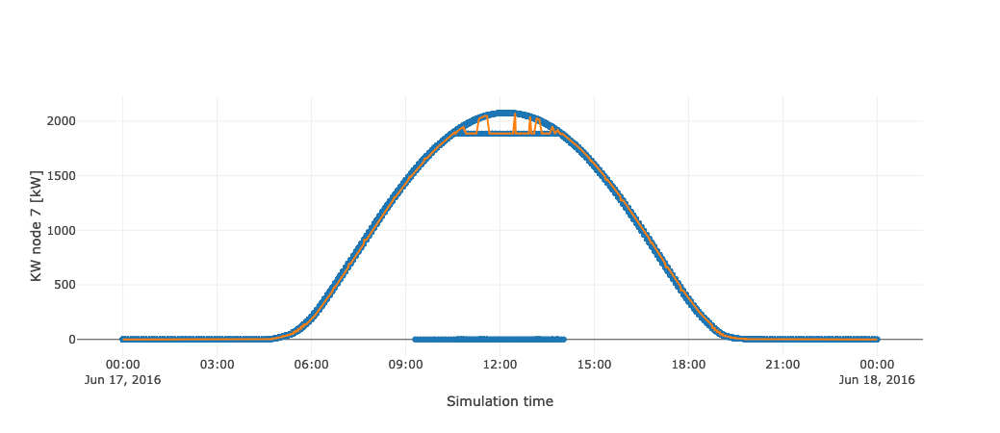

In [25]:
fig = {
    'data': [ 
        
        {'x': debug['datetime'].tolist(),
         'y': debug['KW_7'].tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},

        {'x': results['datetime'].tolist(),
         'y': results['pandapower.KW_7'].tolist(),
         'text': '', 'mode': 'lines',
         'name': ''},
    ]
,
    'layout': {
        'yaxis': {'title': 'KW node 7 [kW]'},
        'xaxis': {'title': 'Simulation time'},
        'showlegend': False
    }
}
iplot(fig)

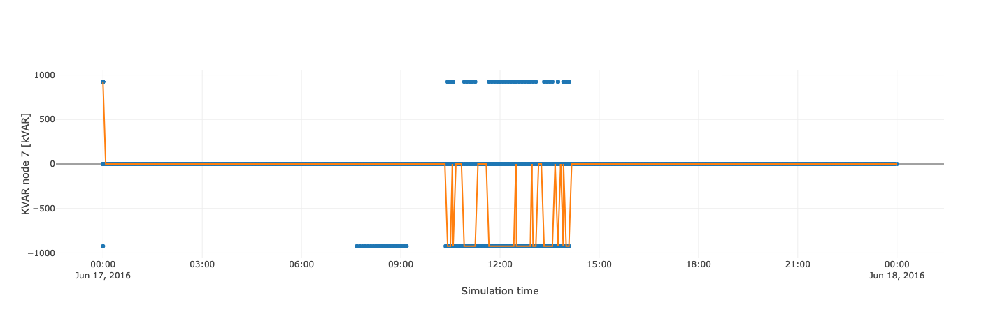

In [16]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].tail(1).tolist(),
         'y': debug.groupby('sim_time')['KVAR_7'].tail(1).tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},
        {'x': results['datetime'].tolist(),
         'y': results['pandapower.KVAR_7'].tolist(),
         'text': '', 'mode': 'lines',
         'name': ''},
        
    ]
,
    'layout': {
        'yaxis': {'title': 'KVAR node 7 [kVAR]'},
        'xaxis': {'title': 'Simulation time'},
        'showlegend': False
    }
}
iplot(fig)

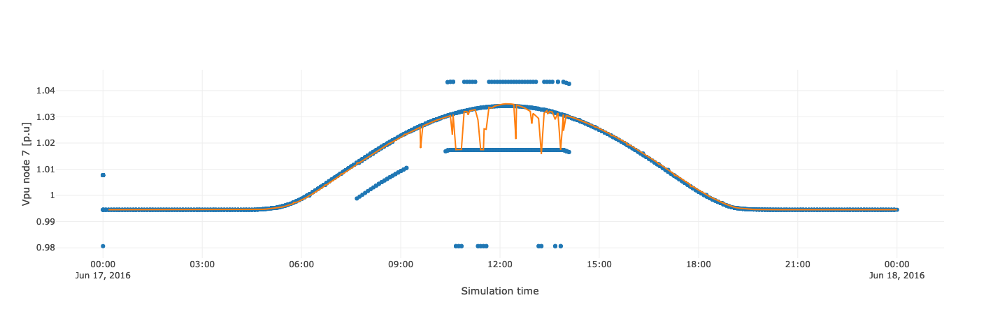

In [17]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].tail(1).tolist(),
         'y': debug.groupby('sim_time')['Vpu_7'].tail(1).tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},
        
        {'x': results['datetime'].tolist()[5:],
         'y': results['pandapower.Vpu_7'].tolist()[5:],
         'text': '', 'mode': 'lines',
         'name': ''},
    ]
,
    'layout': {
        'yaxis': {'title': 'Vpu node 7 [p.u]'},
        'xaxis': {'title': 'Simulation time'},
        'showlegend': False
    }
}
iplot(fig)

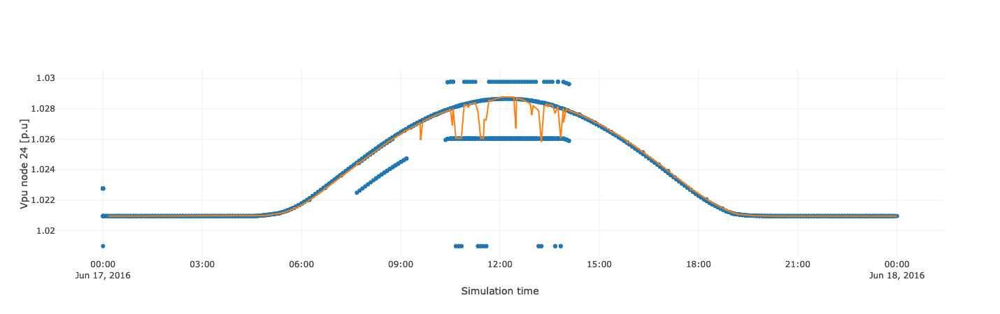

In [18]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].tail(1).tolist(),
         'y': debug.groupby('sim_time')['Vpu_24'].tail(1).tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},
        
        {'x': results['datetime'].tolist()[5:],
         'y': results['pandapower.Vpu_24'].tolist()[5:],
         'text': '', 'mode': 'lines',
         'name': ''},
    ]
,
    'layout': {
        'yaxis': {'title': 'Vpu node 24 [p.u]'},
        'xaxis': {'title': 'Simulation time'},
        'showlegend': False
    }
}
iplot(fig)

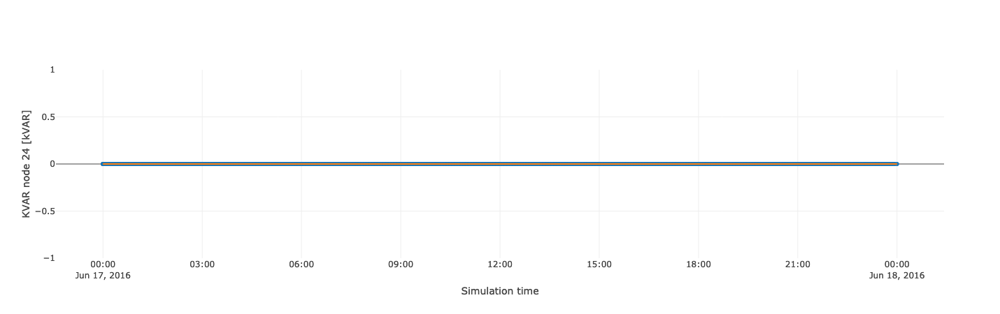

In [19]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].tail(1).tolist(),
         'y': debug.groupby('sim_time')['KVAR_24'].tail(1).tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},
        {'x': results['datetime'].tolist(),
         'y': results['pandapower.KVAR_24'].tolist(),
         'text': '', 'mode': 'lines',
         'name': ''},
        
    ]
,
    'layout': {
        'yaxis': {'title': 'KVAR node 24 [kVAR]'},
        'xaxis': {'title': 'Simulation time'},
        'showlegend': False
    }
}
iplot(fig)

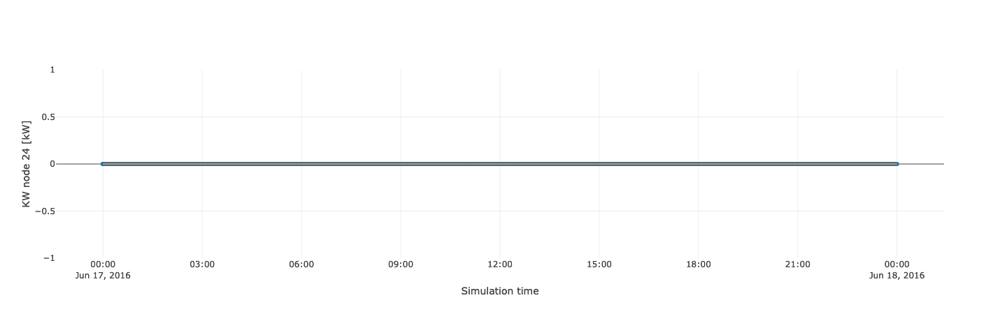

In [20]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].tail(1).tolist(),
         'y': debug.groupby('sim_time')['KW_24'].tail(1).tolist(),
         'text': '', 'mode': 'markers',
         'name': ''},

        {'x': results['datetime'].tolist(),
         'y': results['pandapower.KW_24'].tolist(),
         'text': '', 'mode': 'lines',
         'name': ''},
    ]
,
    'layout': {
        'yaxis': {'title': 'KW node 24 [kW]'},
        'xaxis': {'title': 'Simulation time'},
        'showlegend': False
    }
}
iplot(fig)

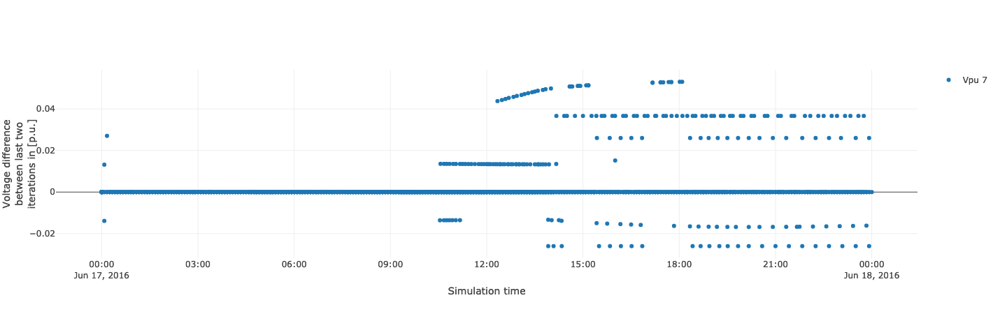

In [21]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': (debug.groupby('sim_time')['Vpu_7'].head(1) -
               debug.groupby('sim_time')['Vpu_7'].head(2)).tolist(),
         'text': '', 'mode': 'markers',
         'name': 'Vpu 7'},
    ]
,
    'layout': {
        'xaxis': {'title': 'Simulation time'},
        'yaxis': {'title': 'Voltage difference<br>between last two<br>iterations in [p.u.]'},
        'showlegend': True
    }
}
iplot(fig)

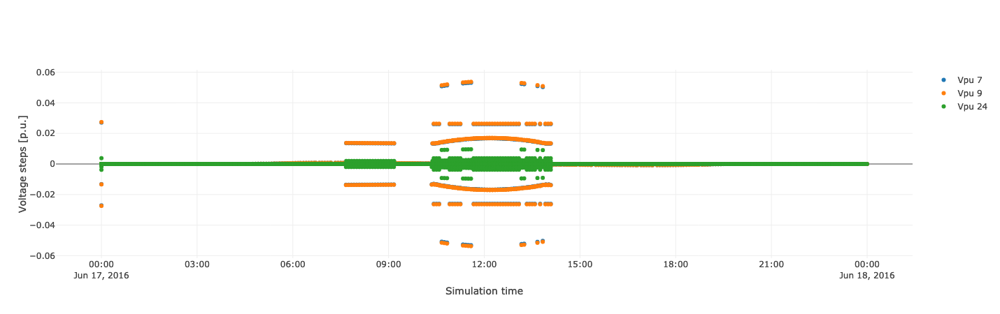

In [22]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': (debug.groupby('sim_time')['Vpu_7'].tail(1).diff()).tolist(),
         'text': '', 'mode': 'markers',
         'name': 'Vpu 7'},
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': (debug.groupby('sim_time')['Vpu_9'].tail(1).diff()).tolist(),
         'text': '', 'mode': 'markers',
         'name': 'Vpu 9'},
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': (debug.groupby('sim_time')['Vpu_24'].tail(1).diff()).tolist(),
         'text': '', 'mode': 'markers',
         'name': 'Vpu 24'},
    ]
,
    'layout': {
        'xaxis': {'title': 'Simulation time'},
        'yaxis': {'title': 'Voltage steps [p.u.]'},
        'showlegend': True
    }
}
iplot(fig)

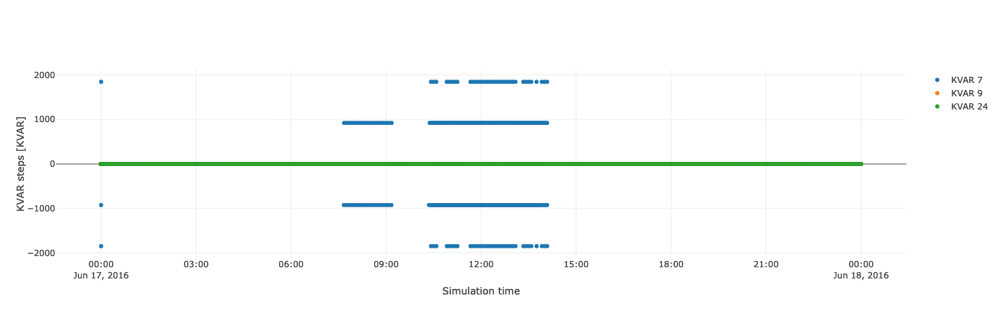

In [23]:
fig = {
    'data': [ 
        
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': (debug.groupby('sim_time')['KVAR_7'].tail(1).diff()).tolist(),
         'text': '', 'mode': 'markers',
         'name': 'KVAR 7'},
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': (debug.groupby('sim_time')['KVAR_9'].tail(1).diff()).tolist(),
         'text': '', 'mode': 'markers',
         'name': 'KVAR 9'},
        {'x': debug.groupby('sim_time')['datetime'].head(1).tolist(),
         'y': (debug.groupby('sim_time')['KVAR_24'].tail(1).diff()).tolist(),
         'text': '', 'mode': 'markers',
         'name': 'KVAR 24'},
    ]
,
    'layout': {
        'xaxis': {'title': 'Simulation time'},
        'yaxis': {'title': 'KVAR steps [KVAR]'},
        'showlegend': True
    }
}
iplot(fig)